In [1]:
from data_loader import DataLoad_Train
from Model_kernel import ImpedanceModel
import torch
import matplotlib.pyplot as plt
import scipy.io as spio

In [2]:
# Here indicating the GPU you want to use. if you don't have GPU, just leave it.
cuda_available = torch.cuda.is_available()
device = torch.device('cuda:1')
torch.set_default_dtype(torch.float)

In [3]:
sample_length = 40
v_smooth_sigma = 5
data_norm = 0
r_seed = 1
results_path = '../results/'

In [4]:
train_seismic_data, train_data_v_smooth, train_label, test_seismic_data, v_smooth, test_label = DataLoad_Train(sample_length, 
                                                                                                               v_smooth_sigma, 
                                                                                                               data_norm, r_seed)

velocity.shape torch.Size([401, 401, 93])
seismic_data.shape torch.Size([401, 401, 93])
train_data.shape torch.Size([40, 93])
train_data_v_smooth.shape torch.Size([40, 93])
label_data.shape torch.Size([40, 93])
test_data.shape torch.Size([401, 401, 93])
test_label.shape torch.Size([401, 401, 93])


In [5]:
torch.min(train_label),torch.max(train_label)

(tensor(2.2999), tensor(6.))

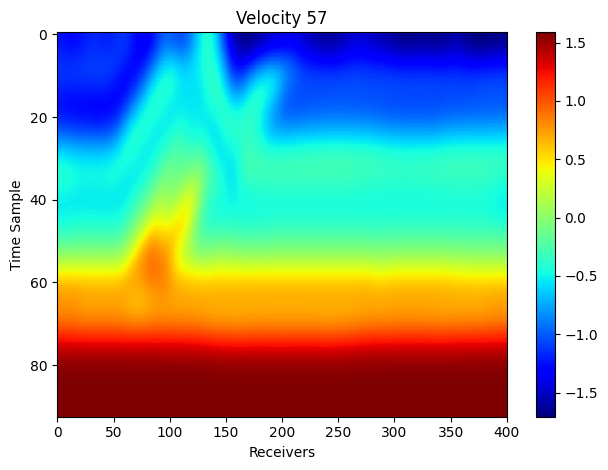

In [6]:
vmin, vmax = torch.quantile(v_smooth[0,:,:].cpu(),torch.tensor([0.01, 0.99]))
plt.imshow(v_smooth[0,:,:].T.cpu(), aspect='auto',
             cmap='jet')
plt.xlabel("Receivers")
plt.ylabel("Time Sample")
plt.title("Velocity 57")
plt.colorbar()

plt.tight_layout()

In [7]:
model_size = train_seismic_data.size()
model_val_size = test_seismic_data.size()

In [8]:
train_data = torch.cat((train_seismic_data.view(model_size[0],1,model_size[1]), 
                        train_data_v_smooth.view(model_size[0],1,model_size[1])), 1)
train_data.shape

torch.Size([40, 2, 93])

In [9]:
# train_data = train_data_v_smooth.view(model_size[0],1,model_size[1])
# train_data.shape

In [10]:
test_data = torch.cat((test_seismic_data.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2]), 
                       v_smooth.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2])), 1)
test_data.shape

torch.Size([160801, 2, 93])

In [11]:
# test_data = v_smooth.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2])
# test_data.shape

In [12]:
torch.std_mean(train_data),torch.std_mean(test_data)

((tensor(1.0084), tensor(-0.0041)), (tensor(1.), tensor(4.6482e-08)))

In [13]:
torch.min(train_data),torch.max(train_data),torch.min(test_data),torch.max(test_data)

(tensor(-3.8516), tensor(3.1631), tensor(-4.7978), tensor(4.5273))

In [14]:
in_channels = 2
out_channels = 1
is_batchnorm = False
net = ImpedanceModel(in_channels, out_channels, is_batchnorm)
net.to(device)

ImpedanceModel(
  (layer1): modelConv1(
    (conv1): Sequential(
      (0): Conv1d(2, 16, kernel_size=(31,), stride=(1,), padding=(15,))
      (1): ReLU(inplace=True)
    )
  )
  (group1): Sequential(
    (0): modelConv1(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
    )
    (1): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
      (conv2): Sequential(
        (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): ReLU(inplace=True)
      )
    )
  )
  (group2): Sequential(
    (0): modelConv1(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
    )
    (1): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(1

In [15]:
# Setup optimiser to perform inversion
optimizer = torch.optim.AdamW(net.parameters())
loss_fn_1 = torch.nn.L1Loss()
# loss_fn_2 = torch.nn.MSELoss()

0 4.165081024169922
50 0.5434817671775818
100 0.33313342928886414
150 0.29915690422058105
200 0.3817536532878876
250 0.25989294052124023
300 0.27676793932914734
350 0.23434415459632874
400 0.21374404430389404
450 0.20048700273036957
500 0.18394094705581665
550 0.174524188041687
600 0.15689419209957123
650 0.13513918220996857
700 0.11977088451385498
750 0.11627499759197235
800 0.10697250813245773
850 0.10458653420209885
900 0.09523067623376846
950 0.10130773484706879
1000 0.09650814533233643


/tmp/ipykernel_225167/296554563.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1050 0.08828778564929962
1100 0.08536753803491592
1150 0.08792531490325928
1200 0.0926414281129837
1250 0.08720681816339493
1300 0.0826118141412735
1350 0.07568894326686859
1400 0.08419370651245117
1450 0.0796714574098587
1500 0.08127005398273468
1550 0.075453020632267
1600 0.07858670502901077
1650 0.062377527356147766
1700 0.07917928695678711
1750 0.07168689370155334
1800 0.07447116076946259
1850 0.0682535320520401
1900 0.07597561925649643
1950 0.061634212732315063
2000 0.06335645169019699
2050 0.07279811799526215
2100 0.06284528970718384
2150 0.1824215054512024
2200 0.08316658437252045
2250 0.09493277966976166
2300 0.07714831084012985
2350 0.08714328706264496
2400 0.07542744278907776
2450 0.09443259239196777
2500 0.06964755803346634
2550 0.08444495499134064
2600 0.06422977149486542
2650 0.08198171854019165
2700 0.06392167508602142
2750 0.06509953737258911
2800 0.06836827099323273
2850 0.07029184699058533
2900 0.06075013801455498
2950 0.06253372132778168
3000 0.0647066980600357
3050 0

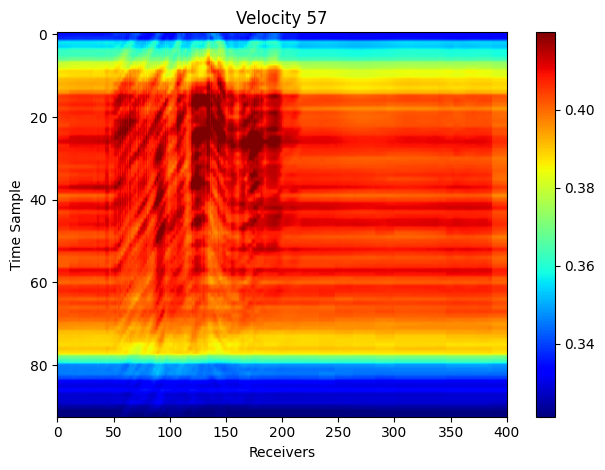

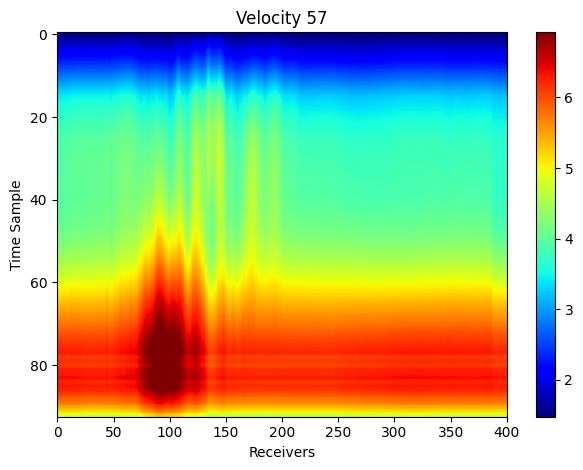

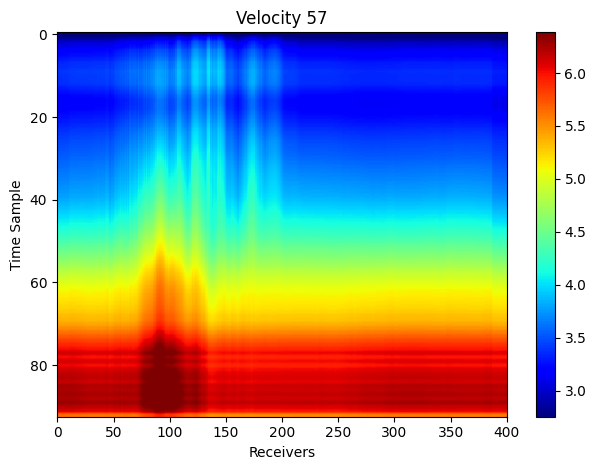

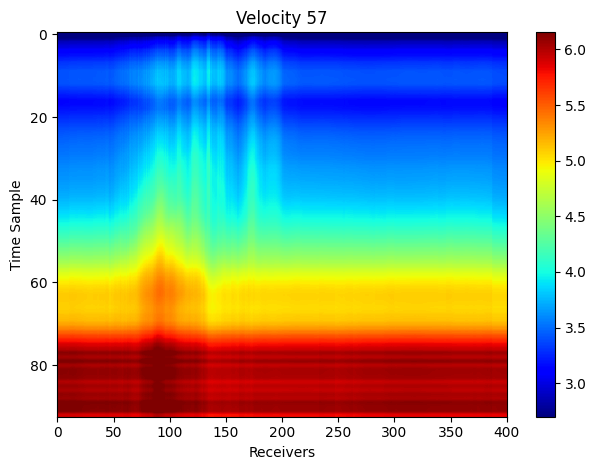

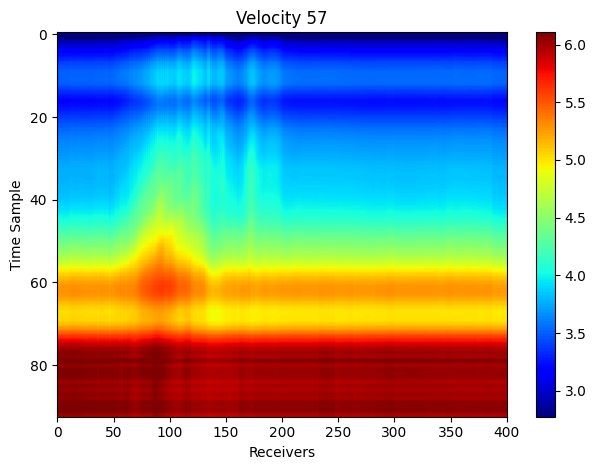

...

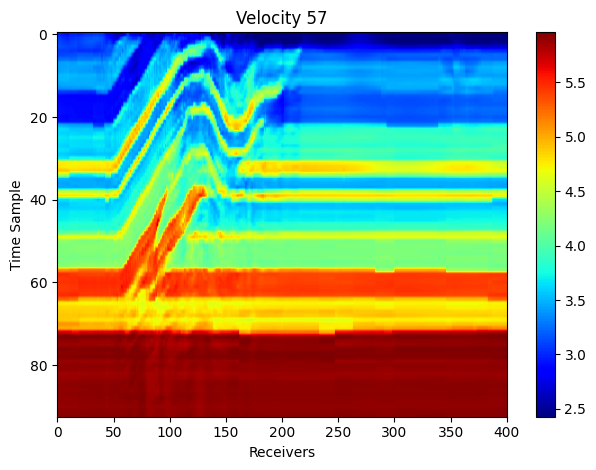

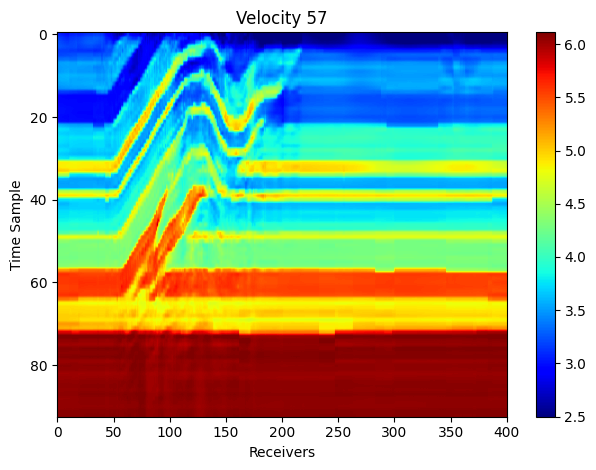

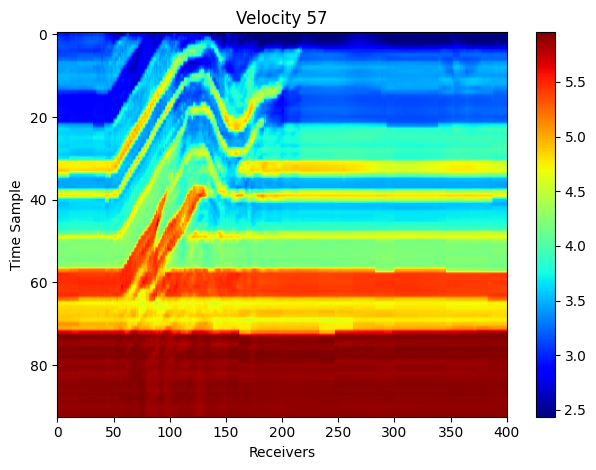

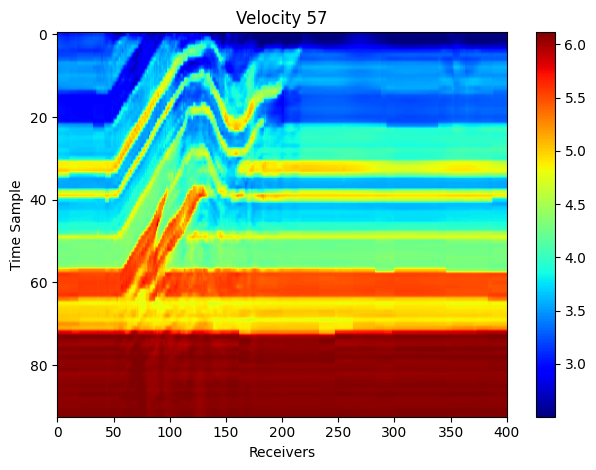

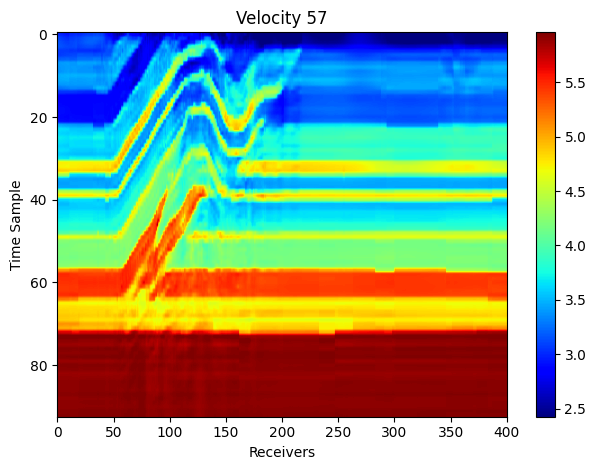

In [16]:
num_epochs = 5000
for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    
    outputs = net(train_data.to(device))
    
#     loss = (
#             loss_fn_1(outputs,
#                     (train_label.view(model_size[0], 1, model_size[1]).to(device))) + 
#             loss_fn_2(outputs,
#                     (train_label.view(model_size[0], 1, model_size[1]).to(device)))
        
#         )
    loss = (
            loss_fn_1(outputs,
                    (train_label.view(model_size[0], 1, model_size[1]).to(device)))
        )
    loss.backward()
    
    optimizer.step()
    
    if epoch % 50 == 0:
        with torch.no_grad():
            print(epoch,loss.item())
            net.eval()
            
            outputs_val = net(test_data.to(device))
            outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
            vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(), torch.tensor([0.01, 0.99]))
            
            plt.figure()
            plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto', cmap='jet', vmax=vmax, vmin=vmin)
            plt.xlabel("Receivers")
            plt.ylabel("Time Sample")
            plt.title("Velocity 57")
            plt.colorbar()

            plt.tight_layout()
            plt.savefig(results_path + str(epoch) + '_pre_velocity_sm.jpg')

In [17]:
# with torch.no_grad():
#     net.eval()

#     outputs_val = net(test_data.to(device))
#     outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
# #     vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(),
# #                     torch.tensor([0.01, 0.99]))
# #     plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto',
# #                  cmap='jet')
# #     plt.xlabel("Receivers")
# #     plt.ylabel("Time Sample")
# #     plt.title("Velocity 57")
# #     plt.colorbar()

# #     plt.tight_layout()
# #     plt.savefig(results_path+'pre_velocity.jpg')
    
#     spio.savemat(results_path + 'pre_velocity_sm.mat',{'pre_velocity':outputs_val.cpu().data.numpy()})